# Klasyfikacja złośliwości nowotworu 

W niniejszym projekcie dokonamy analizy zbioru danych dotyczącego nowotworu gruczołu sutkowego. Na podstawie danych medycznych dotyczących nowotworów stworzymy model klasyfikujący badany guz jako nowotwór złośliwy, bądź łagodny. 

Będziemy operować na zbiorze danych $\textit{Breast Cancer Wisconsin (Diagnostic) Data Set}$. Dane z omawianego zbioru pochodzą ze Szpitala Uniwersyteckiego Uniwersytetu w Wisconsin i dotyczą cech fizycznych nowotworu gruczołu sutkowego oraz faktu, czy nowotwór jest złośliwy bądź nie.

Zbiór został pobrany ze strony https://www.kaggle.com/uciml/breast-cancer-wisconsin-data

## Eksploracyjna analiza danych

Wczytujemy plik do programu

In [1]:
from zipfile import ZipFile

In [2]:
# wczytujemy wyodrębniamy plik z archiwum
file_name = "archive.zip"

#tworzymy obiekt klasy ZipFile
zip =  ZipFile(file_name, 'r')
# wypisanie zawartosci archiwum
zip.printdir()
# wyodrębnianie plikow
zip.extractall()

File Name                                             Modified             Size
data.csv                                       2019-09-19 21:54:02       125204


In [3]:
import os, pandas as pd, math, numpy as np

In [4]:
os.getcwd()

'C:\\Users\\Kamil\\Documents\\Matematyka sem. I st. II\\Zaawansowane programowanie\\Projekt'

In [5]:
filename = '\\data.csv'

In [6]:
# ramka jest duża i chcemy widzieć wszystkie dane
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [7]:
# wczytywanie pliku
breastcancer_dirty_data = pd.read_csv(os.getcwd() + filename, sep=',')
breastcancer_dirty_data.sample(20)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
465,9113239,B,13.240,20.13,86.87,542.9,0.08284,0.12230,0.101000,0.028330,0.1601,0.06432,0.2810,0.8135,3.369,23.81,0.004929,0.06657,0.076830,0.013680,0.01526,0.008133,15.44,25.50,115.00,733.5,0.12010,0.56460,0.65560,0.13570,0.2845,0.12490,NaN
349,899147,B,11.950,14.96,77.23,426.7,0.11580,0.12060,0.011710,0.017870,0.2459,0.06581,0.3610,1.0500,2.455,26.65,0.005800,0.02417,0.007816,0.010520,0.02734,0.003114,12.81,17.72,83.09,496.2,0.12930,0.18850,0.03122,0.04766,0.3124,0.07590,NaN
195,875878,B,12.910,16.33,82.53,516.4,0.07941,0.05366,0.038730,0.023770,0.1829,0.05667,0.1942,0.9086,1.493,15.75,0.005298,0.01587,0.023210,0.008420,0.01853,0.002152,13.88,22.00,90.81,600.6,0.10970,0.15060,0.17640,0.08235,0.3024,0.06949,NaN
281,8912055,B,11.740,14.02,74.24,427.3,0.07813,0.04340,0.022450,0.027630,0.2101,0.06113,0.5619,1.2680,3.717,37.83,0.008034,0.01442,0.015140,0.018460,0.02921,0.002005,13.31,18.26,84.70,533.7,0.10360,0.08500,0.06735,0.08290,0.3101,0.06688,NaN
477,911673,B,13.900,16.62,88.97,599.4,0.06828,0.05319,0.022240,0.013390,0.1813,0.05536,0.1555,0.5762,1.392,14.03,0.003308,0.01315,0.009904,0.004832,0.01316,0.002095,15.14,21.80,101.20,718.9,0.09384,0.20060,0.13840,0.06222,0.2679,0.07698,NaN
287,8913,B,12.890,13.12,81.89,515.9,0.06955,0.03729,0.022600,0.011710,0.1337,0.05581,0.1532,0.4690,1.115,12.68,0.004731,0.01345,0.016520,0.005905,0.01619,0.002081,13.62,15.54,87.40,577.0,0.09616,0.11470,0.11860,0.05366,0.2309,0.06915,NaN
319,894335,B,12.430,17.00,78.60,477.3,0.07557,0.03454,0.013420,0.016990,0.1472,0.05561,0.3778,2.2000,2.487,31.16,0.007357,0.01079,0.009959,0.011200,0.03433,0.002961,12.90,20.21,81.76,515.9,0.08409,0.04712,0.02237,0.02832,0.1901,0.05932,NaN
442,90944601,B,13.780,15.79,88.37,585.9,0.08817,0.06718,0.010550,0.009937,0.1405,0.05848,0.3563,0.4833,2.235,29.34,0.006432,0.01156,0.007741,0.005657,0.01227,0.002564,15.27,17.50,97.90,706.6,0.10720,0.10710,0.03517,0.03312,0.1859,0.06810,NaN
505,915276,B,9.676,13.14,64.12,272.5,0.12550,0.22040,0.118800,0.070380,0.2057,0.09575,0.2744,1.3900,1.787,17.67,0.021770,0.04888,0.051890,0.014500,0.02632,0.011480,10.60,18.04,69.47,328.1,0.20060,0.36630,0.29130,0.10750,0.2848,0.13640,NaN
564,926424,M,21.560,22.39,142.00,1479.0,0.11100,0.11590,0.243900,0.138900,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.051980,0.024540,0.01114,0.004239,25.45,26.40,166.10,2027.0,0.14100,0.21130,0.41070,0.22160,0.2060,0.07115,NaN


In [8]:
# wymiary zbioru
breastcancer_dirty_data.shape

(569, 33)

In [9]:
# liczba elementów
breastcancer_dirty_data.size

18777

In [10]:
# nazwy zmiennych
breastcancer_dirty_data.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [11]:
# zamieniamy białe znaki na _
breastcancer_dirty_data.columns = breastcancer_dirty_data.columns.str.replace(" ", "_")

In [12]:
breastcancer_dirty_data.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave_points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed:_32'],
      dtype='object')

In [13]:
# zmiana na nazw kolumn na wielkie litery
breastcancer_dirty_data.columns = breastcancer_dirty_data.columns.str.upper()

In [14]:
# typy zmiennych
breastcancer_dirty_data.dtypes

ID                           int64
DIAGNOSIS                   object
RADIUS_MEAN                float64
TEXTURE_MEAN               float64
PERIMETER_MEAN             float64
AREA_MEAN                  float64
SMOOTHNESS_MEAN            float64
COMPACTNESS_MEAN           float64
CONCAVITY_MEAN             float64
CONCAVE_POINTS_MEAN        float64
SYMMETRY_MEAN              float64
FRACTAL_DIMENSION_MEAN     float64
RADIUS_SE                  float64
TEXTURE_SE                 float64
PERIMETER_SE               float64
AREA_SE                    float64
SMOOTHNESS_SE              float64
COMPACTNESS_SE             float64
CONCAVITY_SE               float64
CONCAVE_POINTS_SE          float64
SYMMETRY_SE                float64
FRACTAL_DIMENSION_SE       float64
RADIUS_WORST               float64
TEXTURE_WORST              float64
PERIMETER_WORST            float64
AREA_WORST                 float64
SMOOTHNESS_WORST           float64
COMPACTNESS_WORST          float64
CONCAVITY_WORST     

In [15]:
# dodatkowe informacje
breastcancer_dirty_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       569 non-null    int64  
 1   DIAGNOSIS                569 non-null    object 
 2   RADIUS_MEAN              569 non-null    float64
 3   TEXTURE_MEAN             569 non-null    float64
 4   PERIMETER_MEAN           569 non-null    float64
 5   AREA_MEAN                569 non-null    float64
 6   SMOOTHNESS_MEAN          569 non-null    float64
 7   COMPACTNESS_MEAN         569 non-null    float64
 8   CONCAVITY_MEAN           569 non-null    float64
 9   CONCAVE_POINTS_MEAN      569 non-null    float64
 10  SYMMETRY_MEAN            569 non-null    float64
 11  FRACTAL_DIMENSION_MEAN   569 non-null    float64
 12  RADIUS_SE                569 non-null    float64
 13  TEXTURE_SE               569 non-null    float64
 14  PERIMETER_SE             5

In [16]:
# usuwanie zbędnych kolumn
breastcancer_dirty_data.drop(columns = ['UNNAMED:_32', 'ID'], inplace = True)

In [17]:
# zmianna typu DIAGNOSIS na zmienną kategoryczną
breastcancer_dirty_data.DIAGNOSIS = breastcancer_dirty_data.DIAGNOSIS.astype('category')

In [18]:
# liczba wartości zero w kolumnach
(breastcancer_dirty_data == 0).sum(axis=0)


DIAGNOSIS                   0
RADIUS_MEAN                 0
TEXTURE_MEAN                0
PERIMETER_MEAN              0
AREA_MEAN                   0
SMOOTHNESS_MEAN             0
COMPACTNESS_MEAN            0
CONCAVITY_MEAN             13
CONCAVE_POINTS_MEAN        13
SYMMETRY_MEAN               0
FRACTAL_DIMENSION_MEAN      0
RADIUS_SE                   0
TEXTURE_SE                  0
PERIMETER_SE                0
AREA_SE                     0
SMOOTHNESS_SE               0
COMPACTNESS_SE              0
CONCAVITY_SE               13
CONCAVE_POINTS_SE          13
SYMMETRY_SE                 0
FRACTAL_DIMENSION_SE        0
RADIUS_WORST                0
TEXTURE_WORST               0
PERIMETER_WORST             0
AREA_WORST                  0
SMOOTHNESS_WORST            0
COMPACTNESS_WORST           0
CONCAVITY_WORST            13
CONCAVE_POINTS_WORST       13
SYMMETRY_WORST              0
FRACTAL_DIMENSION_WORST     0
dtype: int64

In [19]:
# zamiana wartości zero na średnią
cols =\
['CONCAVITY_MEAN', 'CONCAVE_POINTS_MEAN', 'CONCAVITY_SE',  'CONCAVE_POINTS_SE', 'CONCAVITY_WORST', 'CONCAVE_POINTS_WORST']
for column in cols:
    breastcancer_dirty_data[column].replace(0, breastcancer_dirty_data[column].mean(), inplace = True)

In [86]:
(breastcancer_dirty_data == 0).sum(axis=0)


DIAGNOSIS                  357
RADIUS_MEAN                  0
TEXTURE_MEAN                 0
PERIMETER_MEAN               0
AREA_MEAN                    0
SMOOTHNESS_MEAN              0
COMPACTNESS_MEAN             0
CONCAVITY_MEAN               0
CONCAVE_POINTS_MEAN          0
SYMMETRY_MEAN                0
FRACTAL_DIMENSION_MEAN       0
RADIUS_SE                    0
TEXTURE_SE                   0
PERIMETER_SE                 0
AREA_SE                      0
SMOOTHNESS_SE                0
COMPACTNESS_SE               0
CONCAVITY_SE                 0
CONCAVE_POINTS_SE            0
SYMMETRY_SE                  0
FRACTAL_DIMENSION_SE         0
RADIUS_WORST                 0
TEXTURE_WORST                0
PERIMETER_WORST              0
AREA_WORST                   0
SMOOTHNESS_WORST             0
COMPACTNESS_WORST            0
CONCAVITY_WORST              0
CONCAVE_POINTS_WORST         0
SYMMETRY_WORST               0
FRACTAL_DIMENSION_WORST      0
dtype: int64

###  Wybrane przekształcenia na ramce danych


In [21]:
breastcancer_dirty_data_v1 = breastcancer_dirty_data.copy()

In [22]:
# zamiana zmiennych ilościowych na jakościowe 
for column in breastcancer_dirty_data_v1.drop(['DIAGNOSIS'], axis=1).columns:
    print(column)
    size = math.floor(breastcancer_dirty_data_v1[column].max()) - math.floor(breastcancer_dirty_data_v1[column].min())
    print(size)
    if size <= 3:
        breastcancer_dirty_data_v1[column] = pd.cut(breastcancer_dirty_data_v1[column], 3, labels = ['SMALL', 'MEDIUM', 'LARGE'])
    else:
        breastcancer_dirty_data_v1[column] = pd.cut(breastcancer_dirty_data_v1[column], size,\
            labels = np.arange(math.floor(breastcancer_dirty_data_v1[column].min()),\
                               math.floor(breastcancer_dirty_data_v1[column].max())))
    
                                                                      

RADIUS_MEAN
22
TEXTURE_MEAN
30
PERIMETER_MEAN
145
AREA_MEAN
2358
SMOOTHNESS_MEAN
0
COMPACTNESS_MEAN
0
CONCAVITY_MEAN
0
CONCAVE_POINTS_MEAN
0
SYMMETRY_MEAN
0
FRACTAL_DIMENSION_MEAN
0
RADIUS_SE
2
TEXTURE_SE
4
PERIMETER_SE
21
AREA_SE
536
SMOOTHNESS_SE
0
COMPACTNESS_SE
0
CONCAVITY_SE
0
CONCAVE_POINTS_SE
0
SYMMETRY_SE
0
FRACTAL_DIMENSION_SE
0
RADIUS_WORST
29
TEXTURE_WORST
37
PERIMETER_WORST
201
AREA_WORST
4069
SMOOTHNESS_WORST
0
COMPACTNESS_WORST
1
CONCAVITY_WORST
1
CONCAVE_POINTS_WORST
0
SYMMETRY_WORST
0
FRACTAL_DIMENSION_WORST
0


In [23]:
for column in breastcancer_dirty_data_v1.columns: print({column: [breastcancer_dirty_data_v1[column].cat.categories,
                                                         breastcancer_dirty_data_v1[column].value_counts()]})

{'DIAGNOSIS': [Index(['B', 'M'], dtype='object'), B    357
M    212
Name: DIAGNOSIS, dtype: int64]}
{'RADIUS_MEAN': [Int64Index([ 6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
            23, 24, 25, 26, 27],
           dtype='int64'), 12    86
11    76
10    75
13    60
14    45
9     33
8     29
15    26
19    23
17    22
16    22
18    22
20    17
7     11
21     6
22     4
6      4
27     3
23     2
24     2
25     1
26     0
Name: RADIUS_MEAN, dtype: int64]}
{'TEXTURE_MEAN': [Int64Index([ 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25,
            26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38],
           dtype='int64'), 16    55
18    54
17    52
19    49
15    47
21    46
14    43
20    42
12    27
13    26
24    23
22    22
23    21
27    13
26    12
11     9
10     6
25     5
28     5
29     3
30     3
33     2
9      2
32     1
38     1
31     0
34     0
35     0
36     0
37     0
Name: TEXTURE_MEAN, dtype: int64]}
{'PERIMETER_MEAN

In [24]:
breastcancer_dirty_data_v1 = breastcancer_dirty_data_v1.drop(['DIAGNOSIS'], axis=1).transpose()

In [25]:
# tworzymy ramkę z etykietami hierarchicznymi
breastcancer_dirty_data_v1.index=pd.MultiIndex(
levels=[["MEAN","SE","WORST"], breastcancer_dirty_data_v1.index],
codes=[np.repeat(np.array([0,1,2]), [10,10,10], axis=0), range(0,30)],
names=["level1","level2"])

In [107]:
breastcancer_dirty_data_v1

0       1       2       3       4    \
level1 level2                                                            
MEAN   RADIUS_MEAN                  17      20      19      10      19   
       TEXTURE_MEAN                  9      17      20      19      13   
       PERIMETER_MEAN              122     132     129      76     134   
       AREA_MEAN                  1000    1325    1202     385    1296   
       SMOOTHNESS_MEAN          MEDIUM   SMALL  MEDIUM   LARGE  MEDIUM   
       COMPACTNESS_MEAN          LARGE   SMALL  MEDIUM   LARGE  MEDIUM   
       CONCAVITY_MEAN            LARGE   SMALL  MEDIUM  MEDIUM  MEDIUM   
       CONCAVE_POINTS_MEAN       LARGE  MEDIUM  MEDIUM  MEDIUM  MEDIUM   
       SYMMETRY_MEAN             LARGE  MEDIUM  MEDIUM   LARGE  MEDIUM   
       FRACTAL_DIMENSION_MEAN   MEDIUM   SMALL   SMALL   LARGE   SMALL   
SE     RADIUS_SE                MEDIUM   SMALL   SMALL   SMALL   SMALL   
       TEXTURE_SE                    0       0       0       0       0   
       PERIMETER_SE                  7       2       3       2       4   
       AREA_SE                     152      73      93      26      93   
       SMOOTHNESS_SE             SMALL   SMALL   SMALL   SMALL   SMALL   
       COMPACTNESS_SE           MEDIUM   SMALL   SMALL  MEDIUM   SMALL   
       CONCAVITY_SE              SMALL   SMALL   SMALL   SMALL   SMALL   
       CONCAVE_POINTS_SE         SMALL   SMALL  MEDIUM   SMALL  MEDIUM   
       SYMMETRY_SE               SMALL   SMALL   SMALL   LARGE   SMALL   
       FRACTAL_DIMENSION_SE      SMALL   SMALL   SMALL   SMALL   SMALL   
WORST  RADIUS_WORST                 25      24      23      14      22   
       TEXTURE_WORST                17      23      25      26      16   
       PERIMETER_WORST             184     158     152      98     151   
       AREA_WORST                 2018    1955    1708     567    1574   
       SMOOTHNESS_WORST         MEDIUM  MEDIUM  MEDIUM   LARGE  MEDIUM   
       COMPACTNESS_WORST        MEDIUM   SMALL  MEDIUM   LARGE   SMALL   
       CONCAVITY_WORST          MEDIUM   SMALL  MEDIUM  MEDIUM   SMALL   
       CONCAVE_POINTS_WORST      LARGE  MEDIUM   LARGE   LARGE  MEDIUM   
       SYMMETRY_WORST           MEDIUM   SMALL  MEDIUM   LARGE   SMALL   
       FRACTAL_DIMENSION_WORST  MEDIUM   SMALL   SMALL   LARGE   SMALL   

                                   5       6       7       8       9      10   \
level1 level2                                                                   
MEAN   RADIUS_MEAN                  11      17      13      12      11     15   
       TEXTURE_MEAN                 15      19      20      21      23     22   
       PERIMETER_MEAN               81     118      89      86      83    102   
       AREA_MEAN                   476    1039     577     519     475    797   
       SMOOTHNESS_MEAN           LARGE  MEDIUM  MEDIUM   LARGE  MEDIUM  SMALL   
       COMPACTNESS_MEAN         MEDIUM   SMALL  MEDIUM  MEDIUM   LARGE  SMALL   
       CONCAVITY_MEAN           MEDIUM   SMALL   SMALL  MEDIUM  MEDIUM  SMALL   
       CONCAVE_POINTS_MEAN      MEDIUM  MEDIUM   SMALL  MEDIUM  MEDIUM  SMALL   
       SYMMETRY_MEAN            MEDIUM  MEDIUM  MEDIUM  MEDIUM  MEDIUM  SMALL   
       FRACTAL_DIMENSION_MEAN   MEDIUM   SMALL  MEDIUM  MEDIUM   LARGE  SMALL   
SE     RADIUS_SE                 SMALL   SMALL   SMALL   SMALL   SMALL  SMALL   
       TEXTURE_SE                    0       0       0       0       1      0   
       PERIMETER_SE                  1       2       3       1       1      1   
       AREA_SE                      26      53      50      23      23     39   
       SMOOTHNESS_SE             SMALL   SMALL   SMALL   SMALL   SMALL  SMALL   
       COMPACTNESS_SE            SMALL   SMALL   SMALL   SMALL  MEDIUM  SMALL   
       CONCAVITY_SE              SMALL   SMALL   SMALL   SMALL   SMALL  SMALL   
       CONCAVE_POINTS_SE         SMALL   SMALL   SMALL   SMALL   SMALL  SMALL   
       SYMMETRY_SE               SMALL   SMALL

In [27]:
breastcancer_dirty_data.describe(include='all').round(2)

,DIAGNOSIS,RADIUS_MEAN,TEXTURE_MEAN,PERIMETER_MEAN,AREA_MEAN,SMOOTHNESS_MEAN,COMPACTNESS_MEAN,CONCAVITY_MEAN,CONCAVE_POINTS_MEAN,SYMMETRY_MEAN,FRACTAL_DIMENSION_MEAN,RADIUS_SE,TEXTURE_SE,PERIMETER_SE,AREA_SE,SMOOTHNESS_SE,COMPACTNESS_SE,CONCAVITY_SE,CONCAVE_POINTS_SE,SYMMETRY_SE,FRACTAL_DIMENSION_SE,RADIUS_WORST,TEXTURE_WORST,PERIMETER_WORST,AREA_WORST,SMOOTHNESS_WORST,COMPACTNESS_WORST,CONCAVITY_WORST,CONCAVE_POINTS_WORST,SYMMETRY_WORST,FRACTAL_DIMENSION_WORST
count,569,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00
unique,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,357,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,14.13,19.29,91.97,654.89,0.10,0.10,0.09,0.05,0.18,0.06,0.41,1.22,2.87,40.34,0.01,0.03,0.03,0.01,0.02,0.00,16.27,25.68,107.26,880.58,0.13,0.25,0.28,0.12,0.29,0.08
std,NaN,3.52,4.30,24.30,351.91,0.01,0.05,0.08,0.04,0.03,0.01,0.28,0.55,2.02,45.49,0.00,0.02,0.03,0.01,0.01,0.00,4.83,6.15,33.60,569.36,0.02,0.16,0.20,0.06,0.06,0.02
min,NaN,6.98,9.71,43.79,143.50,0.05,0.02,0.00,0.00,0.11,0.05,0.11,0.36,0.76,6.80,0.00,0.00,0.00,0.00,0.01,0.00,7.93,12.02,50.41,185.20,0.07,0.03,0.00,0.01,0.16,0.06
25%,NaN,11.70,16.17,75.17,420.30,0.09,0.06,0.03,0.02,0.16,0.06,0.23,0.83,1.61,17.85,0.01,0.01,0.02,0.01,0.02,0.00,13.01,21.08,84.11,515.30,0.12,0.15,0.12,0.07,0.25,0.07
50%,NaN,13.37,18.84,86.24,551.10,0.10,0.09,0.07,0.04,0.18,0.06,0.32,1.11,2.29,24.53,0.01,0.02,0.03,0.01,0.02,0.00,14.97,25.41,97.66,686.50,0.13,0.21,0.24,0.10,0.28,0.08
75%,NaN,15.78,21.80,104.10,782.70,0.11,0.13,0.13,0.07,0.20,0.07,0.48,1.47,3.36,45.19,0.01,0.03,0.04,0.01,0.02,0.00,18.79,29.72,125.40,1084.00,0.15,0.34,0.38,0.16,0.32,0.09


In [28]:
# sprawdzamy liczbę nowotworów złośliwych i niezłośliwych
breastcancer_dirty_data.iloc[:,0].value_counts()

B    357
M    212
Name: DIAGNOSIS, dtype: int64

In [29]:
# zmieniamy B i M na cyfry
breastcancer_dirty_data['DIAGNOSIS'].replace(['B', 'M'], [0,1], inplace = True)

In [30]:
# zmianna typu DIAGNOSIS na zmienną kategoryczną
breastcancer_dirty_data['DIAGNOSIS'] = breastcancer_dirty_data['DIAGNOSIS'].astype('category')

In [31]:
breastcancer_dirty_data['DIAGNOSIS'].tail()

564    1
565    1
566    1
567    1
568    0
Name: DIAGNOSIS, dtype: category
Categories (2, int64): [0, 1]

In [32]:
breastcancer_dirty_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   DIAGNOSIS                569 non-null    category
 1   RADIUS_MEAN              569 non-null    float64 
 2   TEXTURE_MEAN             569 non-null    float64 
 3   PERIMETER_MEAN           569 non-null    float64 
 4   AREA_MEAN                569 non-null    float64 
 5   SMOOTHNESS_MEAN          569 non-null    float64 
 6   COMPACTNESS_MEAN         569 non-null    float64 
 7   CONCAVITY_MEAN           569 non-null    float64 
 8   CONCAVE_POINTS_MEAN      569 non-null    float64 
 9   SYMMETRY_MEAN            569 non-null    float64 
 10  FRACTAL_DIMENSION_MEAN   569 non-null    float64 
 11  RADIUS_SE                569 non-null    float64 
 12  TEXTURE_SE               569 non-null    float64 
 13  PERIMETER_SE             569 non-null    float64 
 14  AREA_SE   

In [33]:
# ciekawy pakiet podsumowujący 
import pandas_profiling

In [34]:
#profile = pandas_profiling.ProfileReport(breastcancer_dirty_data)
#profile.to_file("output.html")

Summarize dataset:   0%|          | 0/45 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Budując model powinniśmy zwrócić uwagę na to czy nasze predyktory nie są współliniowe (jeden z predyktorów jest kombinacją liniową innych). Wprowadzanie współliniowych predyktorów powoduje przekazywanie identycznej informacji z wielu miejsc.

Najprostszym sposobem na sprawdzenie czy zmienne są współliniowe jest korelacja:


In [35]:
# wspóczynnik korelacji liniowej Pearsona
correlation = breastcancer_dirty_data.corr()

In [36]:
correlation.round(2)

,RADIUS_MEAN,TEXTURE_MEAN,PERIMETER_MEAN,AREA_MEAN,SMOOTHNESS_MEAN,COMPACTNESS_MEAN,CONCAVITY_MEAN,CONCAVE_POINTS_MEAN,SYMMETRY_MEAN,FRACTAL_DIMENSION_MEAN,RADIUS_SE,TEXTURE_SE,PERIMETER_SE,AREA_SE,SMOOTHNESS_SE,COMPACTNESS_SE,CONCAVITY_SE,CONCAVE_POINTS_SE,SYMMETRY_SE,FRACTAL_DIMENSION_SE,RADIUS_WORST,TEXTURE_WORST,PERIMETER_WORST,AREA_WORST,SMOOTHNESS_WORST,COMPACTNESS_WORST,CONCAVITY_WORST,CONCAVE_POINTS_WORST,SYMMETRY_WORST,FRACTAL_DIMENSION_WORST
RADIUS_MEAN,1.00,0.32,1.00,0.99,0.17,0.51,0.65,0.80,0.15,-0.31,0.68,-0.10,0.67,0.74,-0.22,0.21,0.16,0.33,-0.10,-0.04,0.97,0.30,0.97,0.94,0.12,0.41,0.50,0.72,0.16,0.01
TEXTURE_MEAN,0.32,1.00,0.33,0.32,-0.02,0.24,0.31,0.31,0.07,-0.08,0.28,0.39,0.28,0.26,0.01,0.19,0.15,0.18,0.01,0.05,0.35,0.91,0.36,0.34,0.08,0.28,0.32,0.32,0.11,0.12
PERIMETER_MEAN,1.00,0.33,1.00,0.99,0.21,0.56,0.69,0.83,0.18,-0.26,0.69,-0.09,0.69,0.74,-0.20,0.25,0.20,0.36,-0.08,-0.01,0.97,0.30,0.97,0.94,0.15,0.46,0.53,0.74,0.19,0.05
AREA_MEAN,0.99,0.32,0.99,1.00,0.18,0.50,0.67,0.81,0.15,-0.28,0.73,-0.07,0.73,0.80,-0.17,0.21,0.18,0.34,-0.07,-0.02,0.96,0.29,0.96,0.96,0.12,0.39,0.49,0.70,0.14,0.00
SMOOTHNESS_MEAN,0.17,-0.02,0.21,0.18,1.00,0.66,0.51,0.54,0.56,0.58,0.30,0.07,0.30,0.25,0.33,0.32,0.23,0.36,0.20,0.28,0.21,0.04,0.24,0.21,0.81,0.47,0.42,0.49,0.39,0.50
COMPACTNESS_MEAN,0.51,0.24,0.56,0.50,0.66,1.00,0.87,0.82,0.60,0.57,0.50,0.05,0.55,0.46,0.14,0.74,0.55,0.62,0.23,0.51,0.54,0.25,0.59,0.51,0.57,0.87,0.80,0.80,0.51,0.69
CONCAVITY_MEAN,0.65,0.31,0.69,0.67,0.51,0.87,1.00,0.92,0.50,0.35,0.64,0.13,0.66,0.62,0.12,0.66,0.68,0.67,0.21,0.45,0.67,0.30,0.71,0.66,0.43,0.74,0.88,0.86,0.40,0.51
CONCAVE_POINTS_MEAN,0.80,0.31,0.83,0.81,0.54,0.82,0.92,1.00,0.47,0.18,0.71,0.08,0.72,0.69,0.06,0.47,0.42,0.60,0.13,0.26,0.81,0.30,0.84,0.80,0.44,0.65,0.74,0.91,0.37,0.36
SYMMETRY_MEAN,0.15,0.07,0.18,0.15,0.56,0.60,0.50,0.47,1.00,0.48,0.30,0.13,0.31,0.22,0.19,0.42,0.34,0.40,0.45,0.33,0.19,0.09,0.22,0.18,0.43,0.47,0.44,0.44,0.70,0.44
FRACTAL_DIMENSION_MEAN,-0.31,-0.08,-0.26,-0.28,0.58,0.57,0.35,0.18,0.48,1.00,0.00,0.16,0.04,-0.09,0.40,0.56,0.46,0.37,0.35,0.69,-0.25,-0.05,-0.21,-0.23,0.50,0.46,0.36,0.19,0.33,0.77


In [37]:
import seaborn as sns, matplotlib.pyplot as plt

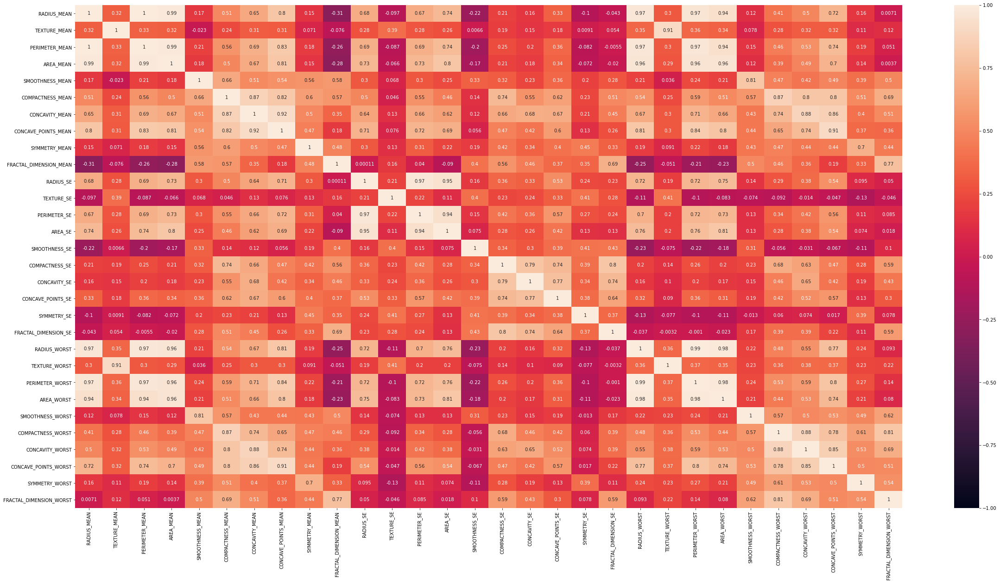

In [38]:
plt.figure(figsize=(40,20))
sns.heatmap(correlation, vmin=-1, vmax=1, annot=True)
plt.show()

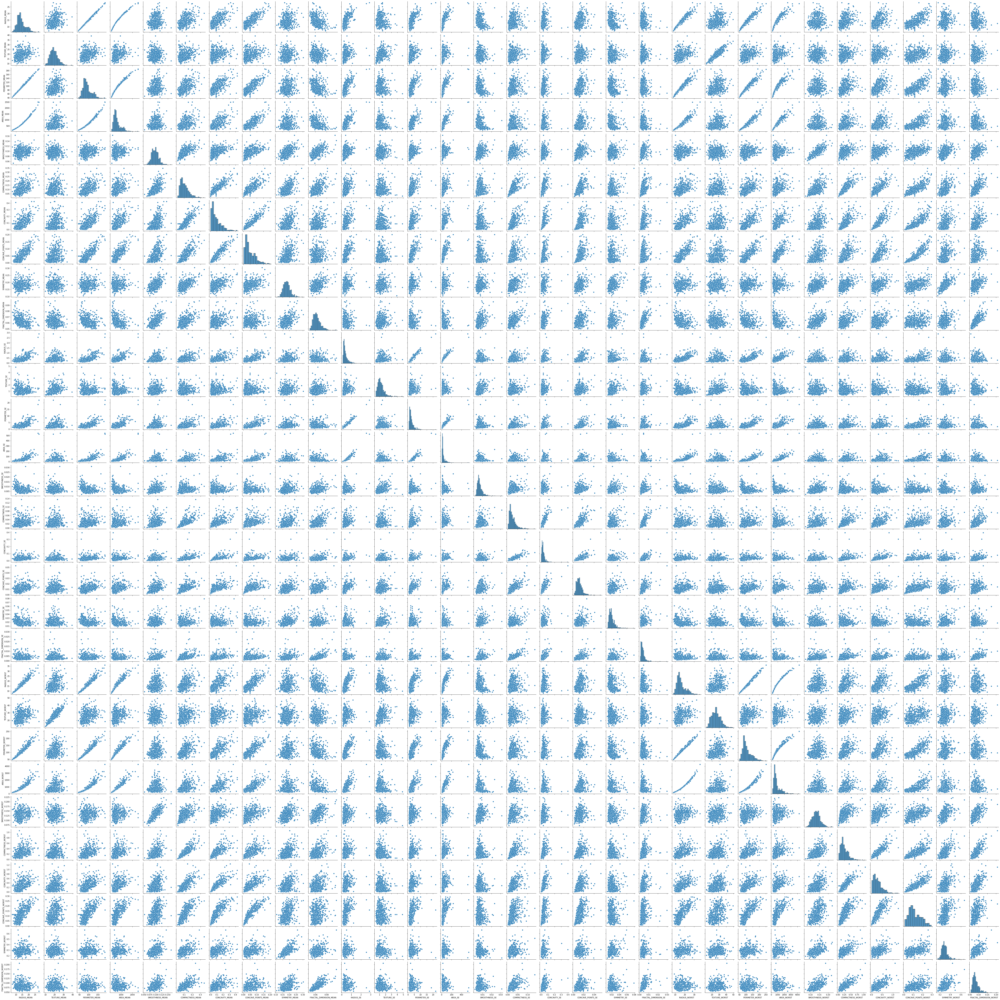

In [39]:
# wizualizacja korelacji przy pomocy seaborn pairplot
#sns.pairplot(breastcancer_dirty_data)
#plt.show()

Znajdźmy zmienne najbardziej skorelowane

In [40]:
type(correlation)

pandas.core.frame.DataFrame

In [108]:
np.ones(correlation.shape)

array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1

In [109]:
np.triu(np.ones(correlation.shape), k=1)
 

array([[0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1

In [45]:
# https://stackoverflow.com/questions/29294983/how-to-calculate-correlation-between-all-columns-and-remove-highly-correlated-on
correlation_upper = correlation.where(np.triu(np.ones(correlation.shape), k=1).astype(np.bool)).copy()
correlation_upper.round(2)

,RADIUS_MEAN,TEXTURE_MEAN,PERIMETER_MEAN,AREA_MEAN,SMOOTHNESS_MEAN,COMPACTNESS_MEAN,CONCAVITY_MEAN,CONCAVE_POINTS_MEAN,SYMMETRY_MEAN,FRACTAL_DIMENSION_MEAN,RADIUS_SE,TEXTURE_SE,PERIMETER_SE,AREA_SE,SMOOTHNESS_SE,COMPACTNESS_SE,CONCAVITY_SE,CONCAVE_POINTS_SE,SYMMETRY_SE,FRACTAL_DIMENSION_SE,RADIUS_WORST,TEXTURE_WORST,PERIMETER_WORST,AREA_WORST,SMOOTHNESS_WORST,COMPACTNESS_WORST,CONCAVITY_WORST,CONCAVE_POINTS_WORST,SYMMETRY_WORST,FRACTAL_DIMENSION_WORST
RADIUS_MEAN,NaN,0.32,1.00,0.99,0.17,0.51,0.65,0.80,0.15,-0.31,0.68,-0.10,0.67,0.74,-0.22,0.21,0.16,0.33,-0.10,-0.04,0.97,0.30,0.97,0.94,0.12,0.41,0.50,0.72,0.16,0.01
TEXTURE_MEAN,NaN,NaN,0.33,0.32,-0.02,0.24,0.31,0.31,0.07,-0.08,0.28,0.39,0.28,0.26,0.01,0.19,0.15,0.18,0.01,0.05,0.35,0.91,0.36,0.34,0.08,0.28,0.32,0.32,0.11,0.12
PERIMETER_MEAN,NaN,NaN,NaN,0.99,0.21,0.56,0.69,0.83,0.18,-0.26,0.69,-0.09,0.69,0.74,-0.20,0.25,0.20,0.36,-0.08,-0.01,0.97,0.30,0.97,0.94,0.15,0.46,0.53,0.74,0.19,0.05
AREA_MEAN,NaN,NaN,NaN,NaN,0.18,0.50,0.67,0.81,0.15,-0.28,0.73,-0.07,0.73,0.80,-0.17,0.21,0.18,0.34,-0.07,-0.02,0.96,0.29,0.96,0.96,0.12,0.39,0.49,0.70,0.14,0.00
SMOOTHNESS_MEAN,NaN,NaN,NaN,NaN,NaN,0.66,0.51,0.54,0.56,0.58,0.30,0.07,0.30,0.25,0.33,0.32,0.23,0.36,0.20,0.28,0.21,0.04,0.24,0.21,0.81,0.47,0.42,0.49,0.39,0.50
COMPACTNESS_MEAN,NaN,NaN,NaN,NaN,NaN,NaN,0.87,0.82,0.60,0.57,0.50,0.05,0.55,0.46,0.14,0.74,0.55,0.62,0.23,0.51,0.54,0.25,0.59,0.51,0.57,0.87,0.80,0.80,0.51,0.69
CONCAVITY_MEAN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.92,0.50,0.35,0.64,0.13,0.66,0.62,0.12,0.66,0.68,0.67,0.21,0.45,0.67,0.30,0.71,0.66,0.43,0.74,0.88,0.86,0.40,0.51
CONCAVE_POINTS_MEAN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.47,0.18,0.71,0.08,0.72,0.69,0.06,0.47,0.42,0.60,0.13,0.26,0.81,0.30,0.84,0.80,0.44,0.65,0.74,0.91,0.37,0.36
SYMMETRY_MEAN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.48,0.30,0.13,0.31,0.22,0.19,0.42,0.34,0.40,0.45,0.33,0.19,0.09,0.22,0.18,0.43,0.47,0.44,0.44,0.70,0.44
FRACTAL_DIMENSION_MEAN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.16,0.04,-0.09,0.40,0.56,0.46,0.37,0.35,0.69,-0.25,-0.05,-0.21,-0.23,0.50,0.46,0.36,0.19,0.33,0.77


In [46]:
correlation_upper = correlation_upper.stack().sort_values(ascending = False)
correlation_upper

RADIUS_MEAN             PERIMETER_MEAN             0.997855
RADIUS_WORST            PERIMETER_WORST            0.993708
RADIUS_MEAN             AREA_MEAN                  0.987357
PERIMETER_MEAN          AREA_MEAN                  0.986507
RADIUS_WORST            AREA_WORST                 0.984015
PERIMETER_WORST         AREA_WORST                 0.977578
RADIUS_SE               PERIMETER_SE               0.972794
PERIMETER_MEAN          PERIMETER_WORST            0.970387
RADIUS_MEAN             RADIUS_WORST               0.969539
PERIMETER_MEAN          RADIUS_WORST               0.969476
RADIUS_MEAN             PERIMETER_WORST            0.965137
AREA_MEAN               RADIUS_WORST               0.962746
                        AREA_WORST                 0.959213
                        PERIMETER_WORST            0.959120
RADIUS_SE               AREA_SE                    0.951830
PERIMETER_MEAN          AREA_WORST                 0.941550
RADIUS_MEAN             AREA_WORST      

In [47]:
correlation_upper[abs(correlation_upper) >= 0.75]

RADIUS_MEAN             PERIMETER_MEAN             0.997855
RADIUS_WORST            PERIMETER_WORST            0.993708
RADIUS_MEAN             AREA_MEAN                  0.987357
PERIMETER_MEAN          AREA_MEAN                  0.986507
RADIUS_WORST            AREA_WORST                 0.984015
PERIMETER_WORST         AREA_WORST                 0.977578
RADIUS_SE               PERIMETER_SE               0.972794
PERIMETER_MEAN          PERIMETER_WORST            0.970387
RADIUS_MEAN             RADIUS_WORST               0.969539
PERIMETER_MEAN          RADIUS_WORST               0.969476
RADIUS_MEAN             PERIMETER_WORST            0.965137
AREA_MEAN               RADIUS_WORST               0.962746
                        AREA_WORST                 0.959213
                        PERIMETER_WORST            0.959120
RADIUS_SE               AREA_SE                    0.951830
PERIMETER_MEAN          AREA_WORST                 0.941550
RADIUS_MEAN             AREA_WORST      

Na podstawie powyższych widzimy, że bardzo wysoką liniową zależność pomiędzy zmiennymi Radius, Area i Perimeter daje nam to informację, mamy do czynienia ze zjawiskiem multiliniowości pomiędzy tymi atrybutami. Podobna sytuacja ma miejsce w przypadku Concavity, compactnes i concave_points.

Te zmienne mogą w bardzo silny sposób zaburzyć model poprzez obniżenie znaczenia innych zmiennych, które nie są zależne. Jako, że te atrybuty niosą ze sobą jedną informację, (np. rozmiar guza dla pierwszych 3), to spośród tych zimennych wybierzemy po jednej odrzucając pozostałe.

Multiliniowość obserwujemy też dla kolumn z sufiksem mean i worst (np. radius mean z radius wors)

Zatem kolejnym krokiem będzie usunięcie kolumn worst, a także zmiennych związanych z radius i tych związanych z concavity

## Oczyszczanie danych

In [48]:
breastcancer_dirty_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   DIAGNOSIS                569 non-null    category
 1   RADIUS_MEAN              569 non-null    float64 
 2   TEXTURE_MEAN             569 non-null    float64 
 3   PERIMETER_MEAN           569 non-null    float64 
 4   AREA_MEAN                569 non-null    float64 
 5   SMOOTHNESS_MEAN          569 non-null    float64 
 6   COMPACTNESS_MEAN         569 non-null    float64 
 7   CONCAVITY_MEAN           569 non-null    float64 
 8   CONCAVE_POINTS_MEAN      569 non-null    float64 
 9   SYMMETRY_MEAN            569 non-null    float64 
 10  FRACTAL_DIMENSION_MEAN   569 non-null    float64 
 11  RADIUS_SE                569 non-null    float64 
 12  TEXTURE_SE               569 non-null    float64 
 13  PERIMETER_SE             569 non-null    float64 
 14  AREA_SE   

In [49]:
# usuwamy zbędne kolumny
breastcancer_cleaned_data =\
breastcancer_dirty_data.drop(breastcancer_dirty_data.columns[[3,4,7,8,13,14,17,18, *range(21,31)]].tolist(), axis=1).copy()

In [50]:
breastcancer_cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   DIAGNOSIS               569 non-null    category
 1   RADIUS_MEAN             569 non-null    float64 
 2   TEXTURE_MEAN            569 non-null    float64 
 3   SMOOTHNESS_MEAN         569 non-null    float64 
 4   COMPACTNESS_MEAN        569 non-null    float64 
 5   SYMMETRY_MEAN           569 non-null    float64 
 6   FRACTAL_DIMENSION_MEAN  569 non-null    float64 
 7   RADIUS_SE               569 non-null    float64 
 8   TEXTURE_SE              569 non-null    float64 
 9   SMOOTHNESS_SE           569 non-null    float64 
 10  COMPACTNESS_SE          569 non-null    float64 
 11  SYMMETRY_SE             569 non-null    float64 
 12  FRACTAL_DIMENSION_SE    569 non-null    float64 
dtypes: category(1), float64(12)
memory usage: 54.1 KB


## Modele uczenia maszynowego

**Podział zmiennych**

In [51]:
# zmienna objaśniana
y = breastcancer_cleaned_data['DIAGNOSIS']
y

0      1
1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     0
20     0
21     0
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
31     1
32     1
33     1
34     1
35     1
36     1
37     0
38     1
39     1
40     1
41     1
42     1
43     1
44     1
45     1
46     0
47     1
48     0
49     0
50     0
51     0
52     0
53     1
54     1
55     0
56     1
57     1
58     0
59     0
60     0
61     0
62     1
63     0
64     1
65     1
66     0
67     0
68     0
69     0
70     1
71     0
72     1
73     1
74     0
75     1
76     0
77     1
78     1
79     0
80     0
81     0
82     1
83     1
84     0
85     1
86     1
87     1
88     0
89     0
90     0
91     1
92     0
93     0
94     1
95     1
96     0
97     0
98     0
99     1
100    1
101    0
102    0
103    0
104    0
105    1
106    0
107    0
108    1
109    0
110    0
1

In [52]:
# zmienne objaśniające
X = breastcancer_cleaned_data.drop(['DIAGNOSIS'], axis=1)
X

,RADIUS_MEAN,TEXTURE_MEAN,SMOOTHNESS_MEAN,COMPACTNESS_MEAN,SYMMETRY_MEAN,FRACTAL_DIMENSION_MEAN,RADIUS_SE,TEXTURE_SE,SMOOTHNESS_SE,COMPACTNESS_SE,SYMMETRY_SE,FRACTAL_DIMENSION_SE
0,17.990,10.38,0.11840,0.27760,0.2419,0.07871,1.0950,0.9053,0.006399,0.049040,0.030030,0.006193
1,20.570,17.77,0.08474,0.07864,0.1812,0.05667,0.5435,0.7339,0.005225,0.013080,0.013890,0.003532
2,19.690,21.25,0.10960,0.15990,0.2069,0.05999,0.7456,0.7869,0.006150,0.040060,0.022500,0.004571
3,11.420,20.38,0.14250,0.28390,0.2597,0.09744,0.4956,1.1560,0.009110,0.074580,0.059630,0.009208
4,20.290,14.34,0.10030,0.13280,0.1809,0.05883,0.7572,0.7813,0.011490,0.024610,0.017560,0.005115
5,12.450,15.70,0.12780,0.17000,0.2087,0.07613,0.3345,0.8902,0.007510,0.033450,0.021650,0.005082
6,18.250,19.98,0.09463,0.10900,0.1794,0.05742,0.4467,0.7732,0.004314,0.013820,0.013690,0.002179
7,13.710,20.83,0.11890,0.16450,0.2196,0.07451,0.5835,1.3770,0.008805,0.030290,0.014860,0.005412
8,13.000,21.82,0.12730,0.19320,0.2350,0.07389,0.3063,1.0020,0.005731,0.035020,0.021430,0.003749
9,12.460,24.04,0.11860,0.23960,0.2030,0.08243,0.2976,1.5990,0.007149,0.072170,0.017890,0.010080


**Standaryzacja Z**
\begin{equation}
z = \frac{x-\mu}{\sigma}
\end{equation}


In [53]:
# standaryzacja zmiennych
X = (X - X.mean(axis=0))/X.std(axis=0)
X.describe()

,RADIUS_MEAN,TEXTURE_MEAN,SMOOTHNESS_MEAN,COMPACTNESS_MEAN,SYMMETRY_MEAN,FRACTAL_DIMENSION_MEAN,RADIUS_SE,TEXTURE_SE,SMOOTHNESS_SE,COMPACTNESS_SE,SYMMETRY_SE,FRACTAL_DIMENSION_SE
count,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02
mean,-1.311195e-16,6.243785e-17,-8.366672e-16,1.998011e-16,1.748260e-16,4.838933e-16,2.497514e-16,-1.123881e-16,-1.545337e-16,1.873136e-16,9.365678e-17,-6.243785e-18
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-2.027864e+00,-2.227289e+00,-3.109349e+00,-1.608721e+00,-2.741705e+00,-1.818265e+00,-1.058992e+00,-1.552898e+00,-1.774504e+00,-1.296957e+00,-1.531542e+00,-1.096004e+00
25%,-6.887793e-01,-7.253249e-01,-7.103378e-01,-7.464292e-01,-7.026215e-01,-7.220040e-01,-6.230224e-01,-6.941984e-01,-6.234697e-01,-6.923171e-01,-6.511078e-01,-5.846041e-01
50%,-2.148925e-01,-1.045442e-01,-3.486040e-02,-2.217454e-01,-7.156354e-02,-1.781226e-01,-2.919882e-01,-1.973239e-01,-2.201415e-01,-2.807733e-01,-2.192375e-01,-2.297383e-01
75%,4.689800e-01,5.836621e-01,6.356397e-01,4.934227e-01,5.303125e-01,4.705693e-01,2.658657e-01,4.661422e-01,3.680315e-01,3.893116e-01,3.553798e-01,2.883884e-01
max,3.967796e+00,4.647799e+00,4.766717e+00,4.564409e+00,4.480808e+00,4.906602e+00,8.899079e+00,6.649429e+00,8.022940e+00,6.138081e+00,7.065700e+00,9.842932e+00


In [54]:
import sklearn
from sklearn.model_selection import train_test_split

### Podział zbioru

In [55]:
# dane dzielimy zbiór treningowy (80%) i testowy (20%)
X_train_80, X_test_80, y_train_80, y_test_80 = sklearn.model_selection.train_test_split(X,y,test_size=0.2,random_state=123)
print(X_train_80.shape)
print(X_test_80.shape)
print(y_train_80.shape)
print(y_test_80.shape)

(455, 12)
(114, 12)
(455,)
(114,)


In [56]:
# dane dzielimy zbiór treningowy (90%) i testowy (10%)
X_train_90, X_test_90, y_train_90, y_test_90 = sklearn.model_selection.train_test_split(X,y,test_size=0.1,random_state=123)
print(X_train_90.shape)
print(X_test_90.shape)
print(y_train_90.shape)
print(y_test_90.shape)

(512, 12)
(57, 12)
(512,)
(57,)


### Metryki

##### Macierz pomyłek
https://en.wikipedia.org/wiki/Confusion_matrix

##### Dokładność/Accuracy
stosunek liczby prawidłowo zaklasyfikowanych do wszystkich
\begin{equation}
ACC = \frac{TP + TN}{TP + TN + FP + FN}
\end{equation}

##### Precision/Precyzja - Jaka część pozytywnych identyfikacji była rzeczywiście poprawna?
proporcja poprawnie rozpoznanych w przypadku, gdy model przewiduje na wyjściu klasę pierwszą
\begin{equation}
P = \frac{TP}{TP + FP}
\end{equation}

##### Recall/Czułość - Jaka część rzeczywistych pozytywów została zidentyfikowana prawidłowo?
Proporcja poprawnie rozpoznanych obserwacji w sytuacji, gdy pochodzą one tak naprawdę z pierwszej klasy 
\begin{equation}
R = \frac{TP}{TP + FN}
\end{equation}

In [57]:
# funkcja dopasowująca model klasyfikatora i wyznacza miary błędów modelu
def fit_classifier(model, X_train, X_test, y_train, y_test):
    '''
    Funkcja dokonująca trenowania modelu i zwracająca metryki błędów
    '''
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    return {
        "Accuracy_train": sklearn.metrics.accuracy_score(y_train, y_train_pred),
        "Accuracy_test": sklearn.metrics.accuracy_score(y_test, y_test_pred),
        "Precision_train": sklearn.metrics.precision_score(y_train, y_train_pred),
        "Precision_test": sklearn.metrics.precision_score(y_test, y_test_pred),
        "Recall_train": sklearn.metrics.recall_score(y_train, y_train_pred),
        "Recall_test": sklearn.metrics.recall_score(y_test, y_test_pred),
    }

### Regresja logistyczna

Załóżmy, że $Y$ jest zmienną objaśnianą o charakterze dyskretnym. Niech $Y$ na podstawie uzyskanych danych na temat wykrytego nowotworu określa, czy jest on złośliwy. Jeżeli tak, to $Y=1$, jeżeli nie, to $Y=0$. Regresja logistyczna, w odróżnieniu od regresji liniowej, nie stara się przewidzieć zmiennej $Y$ na podstawie zmiennej objaśniającej $X$ bezpośrednio, a określa prawdopodobieństwo, że $Y$ będzie przyjmować wartość jednej z możliwych kategorii. Niech $X= \{x_i\}_{i=1}^n$ będzie zmienną objaśniającą, która w naszym przykładzie zawiera dane uzyskane na temat nowotworu; powiedzmy, że $X$ reprezentuje jego wielkość. Wówczas definiujemy prawdopodobieństwo warunkowe
\begin{equation}
    Pr(Y = 1|x_i),
\end{equation}
które określa, prawdopodobieństwo złośliwości nowotworu na podstawie jego rozmiaru. Innymi słowy wyraża prawdopodobieństwo przynależności obserwacji $x_i$ do klasy $Y=1$. W skrócie zapisywać będziemy $P(x_i)$, gdzie
\begin{equation}\label{(2.23)}
    P(x_i) = Pr(Y=1|x_i).
\end{equation}
 Istnieje ciągła funkcja, która osiągając wartość zależną od $x_i$ na przedziale $[0,1]$ pozwala określić przynależność $x_i$ do $Y=1$ lub do $Y=0$. Funkcję tę  nazywamy funkcją logistyczną lub funkcją sigmoidalną. Wyraża się wzorem
\begin{equation}
    P(x_i) = \frac{e^{\beta_0 + \beta_1x_i}}{1 + e^{\beta_0 + \beta_1x_i}},
\end{equation}
równoważnie oznaczamy też przez 
\begin{equation}\label{(2.25)}
    f_{\beta_0,\beta_1}(x_i) = \frac{1}{1 + e^{-(\beta_0 + \beta_1x_i)}}.
\end{equation}
W przypadku, gdy wartość funkcji jest bliższa $0$ obserwacja $x_i$ zostanie przypisana do $Y=0$, w przeciwnym razie przypisana zostanie do $Y=1$.

In [88]:
def logistic_function(x, beta): return 1/(1 + np.exp(-beta*x))

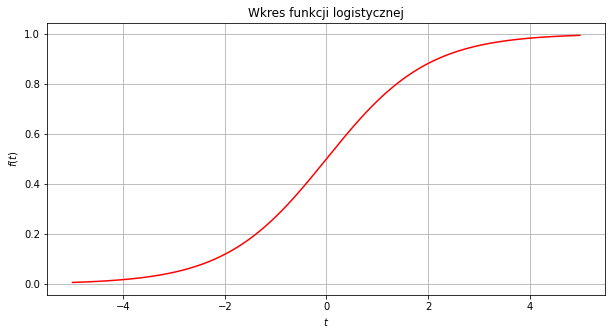

In [89]:
t = np.arange(-5.0, 5.0, 0.01)
x = logistic_function(t,1)
plt.figure(figsize=(10,5))
plt.plot(t,x, color = 'r',)
plt.grid()
plt.title('Wkres funkcji logistycznej')
plt.xlabel('$t$')
plt.ylabel('$f(t)$')
plt.show()

In [90]:
from sklearn.linear_model import LogisticRegression

In [91]:
# trenujemy model dla obu podziałów zbioru
fit_classifier(sklearn.linear_model.LogisticRegression(), X_train_90, X_test_90, y_train_90, y_test_90)

{'Accuracy_train': 0.947265625,
 'Accuracy_test': 0.9298245614035088,
 'Precision_train': 0.9398907103825137,
 'Precision_test': 0.9166666666666666,
 'Recall_train': 0.9148936170212766,
 'Recall_test': 0.9166666666666666}

In [92]:
# podsumowanie wyników
names = ['logistic_regression_90']
results = [fit_classifier(sklearn.linear_model.LogisticRegression(),X_train_90, X_test_90, y_train_90, y_test_90)]
results_df = pd.DataFrame(results, index=names)
results_df

,Accuracy_train,Accuracy_test,Precision_train,Precision_test,Recall_train,Recall_test
logistic_regression_90,0.947266,0.929825,0.939891,0.916667,0.914894,0.916667


In [93]:
# podsumowanie wyników
names.append('logistic_regression_80')
results.append(fit_classifier(sklearn.linear_model.LogisticRegression(),X_train_80, X_test_80, y_train_80, y_test_80))
results_df = pd.DataFrame(results, index = names)
results_df

,Accuracy_train,Accuracy_test,Precision_train,Precision_test,Recall_train,Recall_test
logistic_regression_90,0.947266,0.929825,0.939891,0.916667,0.914894,0.916667
logistic_regression_80,0.942857,0.947368,0.944785,0.926829,0.900585,0.926829


### Nawiny klasyfikator Bayesa

Naiwny klasyfikator Bayesa (ang.naive Bayes classifier) jest modelem nadzorowanego uczenia maszynowego.  Stanowi rozwinięcie idei klasyfikatora Bayesa pozwalającego na przypisanie klasy pewnej obserwacji, bazując na pojęciu prawdopodobieństwa warunkowego oraz wiążącego się z nim twierdzeniu Bayesa. "Naiwność" naiwnego klasyfikatora Bayesa bierze się z założenia, że wszystkie rozważane zmienne predykcyjne są niezależnie, co w większości przypadków dla rzeczywistych danych nie jest prawdą. Koncepcja naiwnego klasyfikatora Bayesa pomimo swojej prostoty, przy odpowiednich danych, jest bardzo efektywnym narzędziem klasyfikacyjnym, które może dorównywać (a nawet przewyższać) wydajnością tak zaawansowanym modelom jak np. sztuczne sieci neuronowe. 

Załóżmy, że mamy zmienne objaśniające $X = (X^{(1)}, X^{(2)},\dots,X^{(d)})$, niech $Y$ będzie zbiorem klas. W naszych rozważaniach ograniczymy się do przypadku klasyfikacji binarnej, tzn. $Y=\{0,1\}$. Prawdopodobieństwo przynależności dowolnej obserwacji $x=(x^{(1)},x^{(2)},\dots, x^{(d)})$ do klasy $y\in Y$ wyrażamy za pomocą wzoru Bayesa jako
\begin{equation}
    P(Y=y|x) = \frac{P(x|Y=y)P(Y=y)}{P(x)}.
\end{equation}

W praktyce wartość mianownika $P(x)$ jest pomijana, gdyż dla każdej badanej klasy jest niezmienna (pełni rolę elementu skalującego). Stąd możemy zapisać 

\begin{equation}
     P(Y=y|x) \propto P(x|Y=y)P(Y=y),
\end{equation}
gdzie symbol "$\propto$" oznacza proporcjonalność (w dalszej części zastępujemy symbolem równości). 

Obserwację $x$ jednoznacznie przypiszemy do klasy $y=1$ wtedy i tylko wtedy, gdy
\begin{equation}\label{(2.32)}
    f_B(x) =\frac{P(Y=1|x)}{P(Y=0|x)} = \frac{P(x|Y=1)P(Y=1)}{P(x|Y=0)P(Y=0)} > 1
\end{equation}
Powyższą funkcję $f_B$ nazywamy klasyfikatorem Bayesa lub klasyfikatorem bayesowskim.

W naiwnym klasyfikatorze Bayesa zakładamy (naiwnie), że wszystkie atrybuty z $X$ są niezależne. Wówczas z własności zmiennych niezależnych możemy zapisać
\begin{equation}
    P(x|y) = P(x^{(1)},x^{(2)},\dots, x^{(d)}|y) =  \prod\limits_{i=1}^d{P(x^{(i)}|y)}.
\end{equation}

Analogicznie do poprzedniego równania możemy zapisać funkcję naiwnego klasyfikatora Bayesa 
\begin{equation}
    f_{NB}(x) = \frac{P(Y=1)}{P(Y=0)}\prod\limits_{i=1}^d\frac{P(x^{(i)}|Y=1)}{P(x^{(i)}|Y=0)}.
\end{equation}

Funkcja $f_{NB}$ jest jednym ze sposobów wyrażenia naiwnego klasyfikatora Bayesa, ogranicza się jednak jedynie do klasyfikacji binarnej. Innym podejściem do przypisania obserwacji $x$ etykiety $y\in Y$ jest wykorzystanie zbioru etykiet wyrażenia $P(y)\prod_{i=1}^d P(x^{(i)}|y)$ dla jakich osiąga ona maksimum, co zapisujemy jako
\begin{equation}
    \hat{y} = \arg\max_{y\in Y} \lbrace P(y)\prod\limits_{i=1}^d P(x^{(i)}|y)\rbrace.
\end{equation}

In [94]:
from sklearn.naive_bayes import GaussianNB

In [95]:
# podsumowanie wyników
names.append('naive_bayes_classifier_90')
results.append(fit_classifier(sklearn.naive_bayes.GaussianNB(), X_train_90, X_test_90, y_train_90, y_test_90))
results_df = pd.DataFrame(results, index = names)
results_df

,Accuracy_train,Accuracy_test,Precision_train,Precision_test,Recall_train,Recall_test
logistic_regression_90,0.947266,0.929825,0.939891,0.916667,0.914894,0.916667
logistic_regression_80,0.942857,0.947368,0.944785,0.926829,0.900585,0.926829
naive_bayes_classifier_90,0.906250,0.912281,0.916667,0.952381,0.819149,0.833333


In [96]:
# podsumowanie wyników
names.append('naive_bayes_classifier_80')
results.append(fit_classifier(sklearn.naive_bayes.GaussianNB(), X_train_80, X_test_80, y_train_80, y_test_80))
results_df = pd.DataFrame(results, index = names)
results_df

,Accuracy_train,Accuracy_test,Precision_train,Precision_test,Recall_train,Recall_test
logistic_regression_90,0.947266,0.929825,0.939891,0.916667,0.914894,0.916667
logistic_regression_80,0.942857,0.947368,0.944785,0.926829,0.900585,0.926829
naive_bayes_classifier_90,0.906250,0.912281,0.916667,0.952381,0.819149,0.833333
naive_bayes_classifier_80,0.903297,0.903509,0.915033,0.941176,0.818713,0.780488


### Algorytm kNN

Niech $k$ będzie ustaloną liczbą naturalną, $X$ zbiórem zmiennych objaśniających, $x_j$ będzie obserwacją, którą chcemy zaklasyfikować, a $y\in Y$ jedną z możliwych klas. Klasyfikator wykorzystujący algorytm kNN traktuje każdą obserwację jako punkt w przestrzeni $\mathbb{R}^d$. Wyznacza $k$ najbliższych (w sensie ustalonej metryki) obserwacji do $x_j$, oznaczmy ich zbiór jako $N$. Następnie dokonywana jest estymacja prawdopodobieństwa przynależności obserwacji $x_j$ do klasy $y$ poprzez stosunek liczby  sąsiednich obserwacji klasy $y$ do liczby $k$
\begin{equation}
    P(Y=y|x_j) =\frac{1}{k} \sum\limits_{i \in N}{\delta(y_i, y)},
\end{equation}
gdzie $y_i$ jest etykietą odpowiadającą $i$-tej obserwacji ze zbioru $N$, a funkcja $\delta$, zdefiniowana jako delta Kroneckera wyraża się wzorem
\begin{equation}
    \delta(y_i,y) = \left\{ \begin{array}{ll}
    1,\quad\textrm{gdy $y_i = y$}\\
    0,\quad\textrm{gdy $y_i \neq y$}
\end{array} \right.
\end{equation}
Następnie algorytm przypisuje obserwację $x_j$ do klasy o dominującym prawdopodobieństwie spośród rozważanych sąsiadów.

W metodach wykorzystujących algorytm kNN bardzo istotny jest wybór odpowiedniej odległości, którą niekiedy nazywamy miarą niepodobieństwa (gdyż im bardziej zwiększymy odległość pomiędzy dwoma obiektami, tym bardziej są one do siebie niepodobne).

Funkcję $d: \mathbb{R} \times \mathbb{R} \to \mathbb{R}$ nazywamy miarą niepodobieństwa jeżeli:
1. $\forall_{x,y\in\mathbb{R}}\quad d(x,y) \geq 0$.
2. $\forall_{x,y\in\mathbb{R}}\quad d(x,y) = 0 \iff x = y$.
3. $\forall_{x,y\in\mathbb{R}}\quad d(x,y) = d(y,x)$.


Tak zdefiniowaną funkcję nazywamy też semi-metryką. Zwróćmy uwagę, że nie jest koniecznym, by funkcja $d$ spełniała warunek trójkąta dla metryk, jako że interesują nas jedynie obserwacje oddalone bezpośrednio od obserwacji badanej. Pomimo tego, funkcja $d$ często spełnia wszystkie aksjomaty metryki. W zależności od charakteru badanej obserwacji wykorzystujemy inne miary niepodobieństwa. 
Metryki, które najczęściej wykorzystuje się w algorytmie kNN to m.in. metryka euklidesowa, metryka Mahalanobisa, metryka Minkowskiego.

Kolejną bardzo istotną kwestią dla algorytmu kNN jest wybór odpowiedniej liczby $k$. Jeżeli $k$ zostanie dobrane jako zbyt duże, może to skutkować niedokładnością predykcji. Z kolei dla małych wartości parametru $k$ predykcja może okazać się zbyt zmienna. Nie ma ściśle określonych metod, które pozwoliłyby ustalić najlepszą wartość $k$. Jednym ze sposobów na wybór $k$ może być stworzenie wykresu zależności niedokładności modelu (np. stosunek zaklasyfikowanych obserwacji danej klasy do wszystkich obserwacji danej klasy) od liczby $k$, a następnie ustalenie takiego $k$, dla którego niedokładność jest najmniejsza.

In [97]:
from sklearn.neighbors import KNeighborsClassifier

In [98]:
# podsumowanie wyników
names.append('KNN_90')
results.append(fit_classifier(sklearn.neighbors.KNeighborsClassifier(), X_train_90, X_test_90, y_train_90, y_test_90))
results_df = pd.DataFrame(results, index = names)
results_df

,Accuracy_train,Accuracy_test,Precision_train,Precision_test,Recall_train,Recall_test
logistic_regression_90,0.947266,0.929825,0.939891,0.916667,0.914894,0.916667
logistic_regression_80,0.942857,0.947368,0.944785,0.926829,0.900585,0.926829
naive_bayes_classifier_90,0.906250,0.912281,0.916667,0.952381,0.819149,0.833333
naive_bayes_classifier_80,0.903297,0.903509,0.915033,0.941176,0.818713,0.780488
KNN_90,0.951172,0.929825,0.971098,0.916667,0.893617,0.916667


In [99]:
# podsumowanie wyników
names.append('KNN_80')
results.append(fit_classifier(sklearn.neighbors.KNeighborsClassifier(), X_train_80, X_test_80, y_train_80, y_test_80))
results_df = pd.DataFrame(results, index = names)
results_df

,Accuracy_train,Accuracy_test,Precision_train,Precision_test,Recall_train,Recall_test
logistic_regression_90,0.947266,0.929825,0.939891,0.916667,0.914894,0.916667
logistic_regression_80,0.942857,0.947368,0.944785,0.926829,0.900585,0.926829
naive_bayes_classifier_90,0.906250,0.912281,0.916667,0.952381,0.819149,0.833333
naive_bayes_classifier_80,0.903297,0.903509,0.915033,0.941176,0.818713,0.780488
KNN_90,0.951172,0.929825,0.971098,0.916667,0.893617,0.916667
KNN_80,0.942857,0.921053,0.967742,0.921053,0.877193,0.853659


**Zbadamy jakość klasyfikatora KNN w zależności od k i wykorzystanej metryki**

In [100]:
knn = sklearn.neighbors.KNeighborsClassifier()
knn.fit(X_train_90, y_train_90)
y_train_pred = knn.predict(X_train_90)
TN = np.sum((y_train_90==0) & (y_train_pred==0))
TN

319

In [101]:
# macierz pomyłek
sklearn.metrics.confusion_matrix(y_train_90, y_train_pred)

array([[319,   5],
       [ 20, 168]], dtype=int64)

In [102]:
y_test_pred = knn.predict(X_test_90)

In [103]:
def knn_acc(distance_measure, k_last):
    '''
    Funkcja wyznaczająca dokładności modelu dla zadanej metryki dla kolejnych k i stosunku podziału zbioru na 8:2
    '''
    knn_train_acc = list()
    knn_test_acc = list()
    for i in range(1, k_last+1):
        knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors=i, metric = distance_measure) 
        knn.fit(X_train_80, y_train_80) 
        y_train_pred = knn.predict(X_train_80)
        y_test_pred = knn.predict(X_test_80) 

        knn_train_acc.append(sklearn.metrics.accuracy_score(y_train_80, y_train_pred))
        knn_test_acc.append(sklearn.metrics.accuracy_score(y_test_80, y_test_pred))
    return([knn_train_acc, knn_test_acc])

In [104]:
knn_minkowski = knn_acc('minkowski', 20)
knn_manhattan = knn_acc('manhattan', 20)
knn_chebyshev = knn_acc('chebyshev', 20)
knn_euclidean = knn_acc('euclidean', 20)

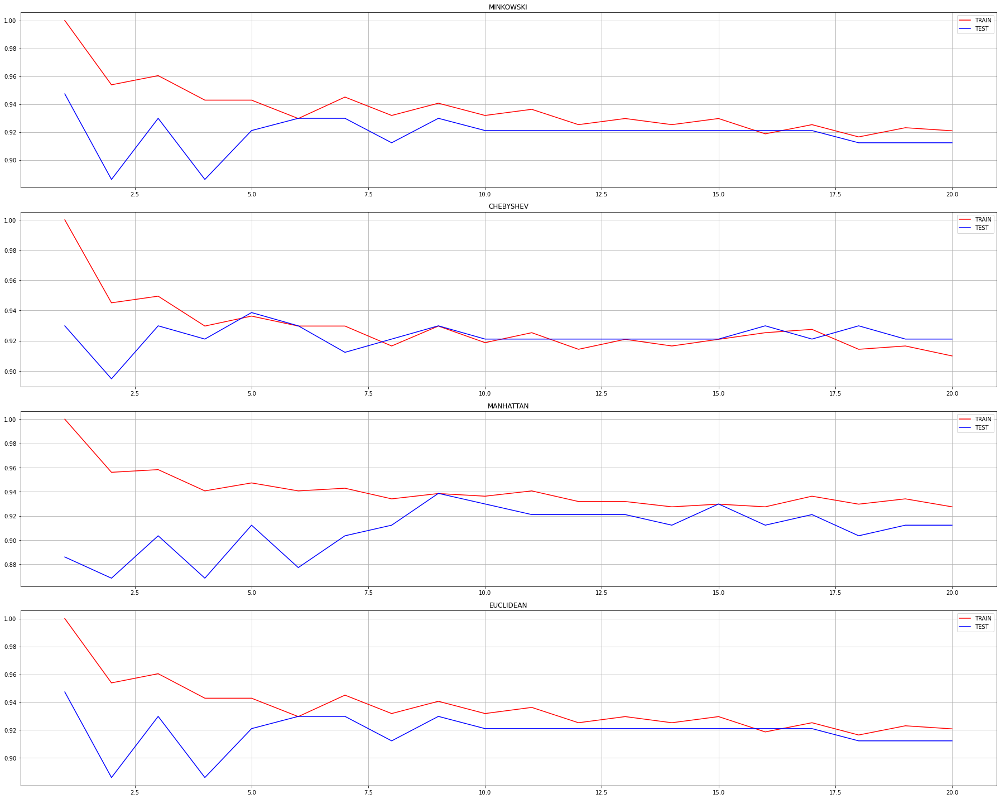

In [105]:
# tworzymy wykresy zależności

plt.figure(figsize=(25, 20)) 
t = np.arange(1, 21)
a1 = plt.subplot2grid((4,4),(0,0), rowspan = 1, colspan = 4)
a2 = plt.subplot2grid((4,4),(1,0), rowspan = 1, colspan = 4)
a3 = plt.subplot2grid((4,4),(2,0), rowspan = 1, colspan = 4)
a4 = plt.subplot2grid((4,4),(3,0), rowspan = 1, colspan = 4)

a1.plot(t, knn_minkowski[0], label='TRAIN', color = 'r')
a1.plot(t, knn_minkowski[1], label='TEST', color = 'b')
a1.grid()
a1.set_title('MINKOWSKI')
a1.legend()

a2.plot(t, knn_chebyshev[0], label='TRAIN', color = 'r')
a2.plot(t, knn_chebyshev[1], label='TEST', color = 'b')
a2.grid()
a2.set_title('CHEBYSHEV')
a2.legend()

a3.plot(t, knn_manhattan[0], label='TRAIN', color = 'r')
a3.plot(t, knn_manhattan[1], label='TEST', color = 'b')
a3.grid()
a3.set_title('MANHATTAN')
a3.legend()

a4.plot(t, knn_euclidean[0], label='TRAIN', color = 'r')
a4.plot(t, knn_euclidean[1], label='TEST', color = 'b')
a4.grid()
a4.set_title('EUCLIDEAN')
a4.legend()

plt.tight_layout()
plt.show()

In [106]:
# podsumowanie wyników
names.append('KNN_80_6')
results.append(fit_classifier(sklearn.neighbors.KNeighborsClassifier(n_neighbors=6), X_train_80, X_test_80, y_train_80, y_test_80))
results_df = pd.DataFrame(results, index = names)
results_df

,Accuracy_train,Accuracy_test,Precision_train,Precision_test,Recall_train,Recall_test
logistic_regression_90,0.947266,0.929825,0.939891,0.916667,0.914894,0.916667
logistic_regression_80,0.942857,0.947368,0.944785,0.926829,0.900585,0.926829
naive_bayes_classifier_90,0.906250,0.912281,0.916667,0.952381,0.819149,0.833333
naive_bayes_classifier_80,0.903297,0.903509,0.915033,0.941176,0.818713,0.780488
KNN_90,0.951172,0.929825,0.971098,0.916667,0.893617,0.916667
KNN_80,0.942857,0.921053,0.967742,0.921053,0.877193,0.853659
KNN_80_6,0.929670,0.929825,0.986014,0.971429,0.824561,0.829268
